In [1]:
import pandas as pd
import numpy as np
import re
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from tqdm.notebook import tqdm

In [2]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
import string
import contractions

In [3]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [4]:
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax

#Load the pre-trained model
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

In [5]:
def word_cloud(df):
    all_messages = ' '.join(df['content'])

    plt.figure(figsize = (20,20)) # Text Reviews with Poor Ratings
    wc = WordCloud(background_color='white', min_font_size = 3,  max_words = 3000 , width = 1600 , height = 800).generate(all_messages)
    plt.imshow(wc,interpolation = 'bilinear')

    # Display the WordCloud image
    #plt.imshow(wordCloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [6]:
def word_cloud_comp(df):
    all_messages = ' '.join(df['content'])

    plt.figure(figsize = (20,20)) # Text Reviews with Poor Ratings
    wc = WordCloud(background_color='white', min_font_size = 3,  max_words = 3000 , width = 1000 , height = 1200).generate(all_messages)
    plt.imshow(wc,interpolation = 'bilinear')

    # Display the WordCloud image
    #plt.imshow(wordCloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [7]:
def mean_score(df):
    df2 = df["score"].mean()
    print('mean score:', df2)

In [8]:
def review_count(df):
    ax = df['score'].value_counts().sort_index()
    pl = ax.plot(kind='bar', title='Count of Reviews by Stars', figsize=(10, 5))
    pl.set_xlabel('Review Stars')
    print('Review Count')
    print(ax)

In [9]:
def roberta_polarity_scores(sentence):
    encoded_text = tokenizer(sentence, return_tensors='pt')
    output = model(**encoded_text)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    scores_dict = {
        'roberta_neg' : scores[0],
        'roberta_neu' : scores[1],
        'roberta_pos' : scores[2]
    }
    return scores_dict

In [10]:
def roberta_data(df):
    res = {}
    for i, row in tqdm(df.iterrows(), total=len(df)):
        try:
            text = row['content']
            myid = row['reviewId']
            roberta_result = roberta_polarity_scores(text)
            res[myid] = roberta_result
        except RuntimeError:
            print(f'Broke at id {myid}')
    return res

In [11]:
def data_after_roberta(df):
    results_df = pd.DataFrame(roberta_data(df)).T
    results_df = results_df.reset_index().rename(columns={'index': 'reviewId'})
    results_df = results_df.merge(df, how='left')
    results_df['sentiment'] = results_df[['roberta_neg','roberta_neu', 'roberta_pos']].idxmax(axis=1)
    return results_df

In [12]:
def sent_count(results_df):
    positive = (results_df['sentiment'] == 'roberta_pos').sum()
    neutral = (results_df['sentiment'] == 'roberta_neu').sum()
    negative = (results_df['sentiment'] == 'roberta_neg').sum()
    print("Total positive reviews:", positive)
    print("Total negative reviews:", negative)
    print("Total neutral reviews:", neutral)

In [13]:
def preprocess_reviews(df):
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    df['final reviews'] = ''

    for index, row in df.iterrows():
        review = row['content']
        # Expand contractions
        expanded_review = contractions.fix(review)
        # Tokenization
        tokens = word_tokenize(expanded_review.lower())
        # Remove stopwords and punctuations
        tokens = [token for token in tokens if token not in stop_words and token not in string.punctuation]
        # Lemmatization
        tokens = [lemmatizer.lemmatize(token) for token in tokens]
        # Join tokens back to text
        final_review = ' '.join(tokens)
        df.at[index, 'final reviews'] = final_review

    return df

In [14]:
def count_words(results_df):
    
    notification = 0
    for k in results_df['final reviews']:
        if 'notification' in k:
            notification += 1
    
    print("Total notification word:", notification)

In [15]:
def count_tuple_occurrences(df, highest_value, tuple_length):
    word_counts = Counter()

    for index, row in df.iterrows():
        highest = row['sentiment']
        final_review = row['final reviews']

        if highest == highest_value:
            words = final_review.split()
            tuples = zip(*[words[i:] for i in range(tuple_length)])

            for tup in tuples:
                tuple_words = ' '.join(tup)
                word_counts[tuple_words] += 1

    return word_counts

In [16]:
def create_bargraph(df):
    df_f = df
    # Convert 'at' column to datetime type and set as index
    df['at'] = pd.to_datetime(df['at'])
    df.set_index('at', inplace=True)

    # Extract the date component for resampling
    df['date'] = df.index.date

    # Resample the DataFrame by 3 months and count occurrences of 'highest' values
    resampled = df.groupby(pd.Grouper(freq='3M')).agg({'sentiment': 'value_counts'}).unstack()
    print(resampled)
    # Plot the bar graph
    resampled.plot(kind='bar', stacked=True)

    # Format x-axis labels as time period
    plt.xticks(range(len(resampled.index)), [f'{d.strftime("%Y-%m")} - {(d + pd.DateOffset(months=3)).strftime("%Y-%m")}' for d in resampled.index], rotation=45)

    # Set plot title and axis labels
    plt.title('Occurrences of Values in Highest Column by 3-Month Periods')
    plt.xlabel('3-Month Period')
    plt.ylabel('Occurrences')
    df = df_f
    # Show the plot
    plt.show()

In [17]:
def save_name(name):
    p = name.split('.')
    h = p[1]+'.csv'
    return h

In [18]:
app_ids=['com.mysecondteacher.nepal', 'com.neemacademy.app', 'school.mero.lms', 'com.midas.eclassnew']

mysecondteacher.csv starts
Total reviews: 112


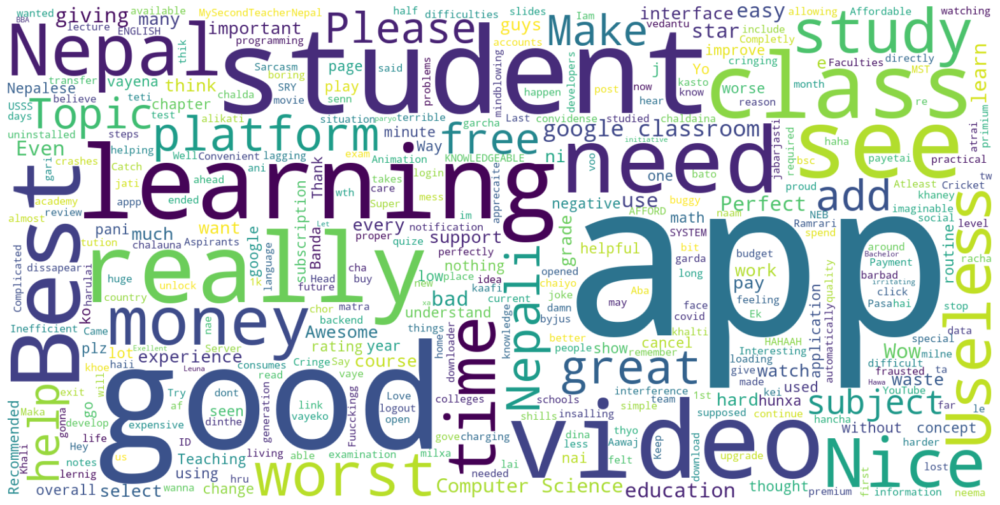

mean score: 2.9464285714285716
Review Count
score
1    51
2     3
3     7
4     3
5    48
Name: count, dtype: int64


  0%|          | 0/112 [00:00<?, ?it/s]

Total positive reviews: 51
Total negative reviews: 38
Total neutral reviews: 23
Total notification word: 1
Negative reviews, single word: Counter({'app': 28, 'good': 6, 'worst': 6, 'money': 6, 'see': 6, 'google': 5, 'useless': 5, 'time': 4, 'study': 4, 'ever': 4, 'need': 4, 'free': 4, 'star': 4, 'giving': 4, 'video': 3, 'hard': 3, 'work': 3, 'classroom': 3, 'use': 3, 'class': 3, 'really': 3, 'like': 3, 'waste': 3, 'want': 3, 'bad': 3, 'important': 3, 'show': 2, 'watch': 2, 'without': 2, 'make': 2, 'student': 2, 'experience': 2, 'many': 2, 'one': 2, 'used': 2, 'worse': 2, 'every': 2, 'even': 2, 'nothing': 2, '🙄🙄': 2, 'page': 2, 'pay': 2, 'get': 2, 'guy': 2, '10': 2, 'low': 2, 'rating': 2, 'negative': 2, '..': 2, 'plz': 2, 'cancel': 2, 'seen': 2, 'j': 2, '...': 2, 'notification': 1, 'also': 1, 'idea': 1, 'able': 1, 'interference': 1, 'terrible': 1, 'inefficient': 1, 'around': 1, 'simple': 1, 'thing': 1, 'made': 1, 'harder': 1, 'supposed': 1, 'atleast': 1, 'buggy': 1, 'half': 1, 'college'

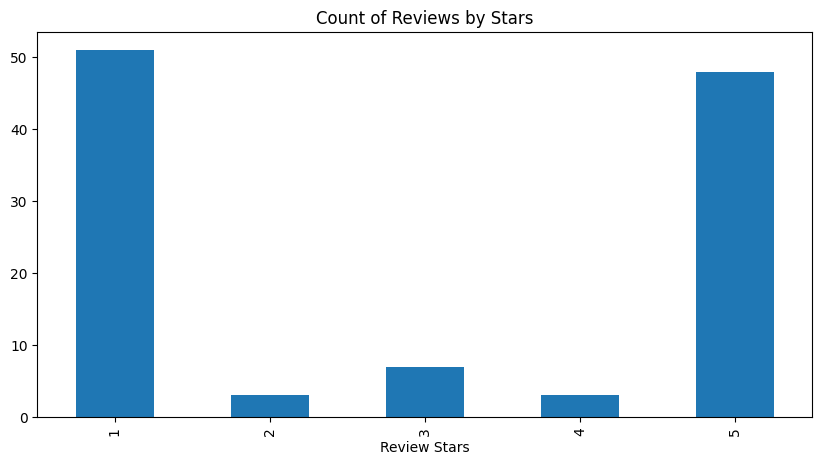

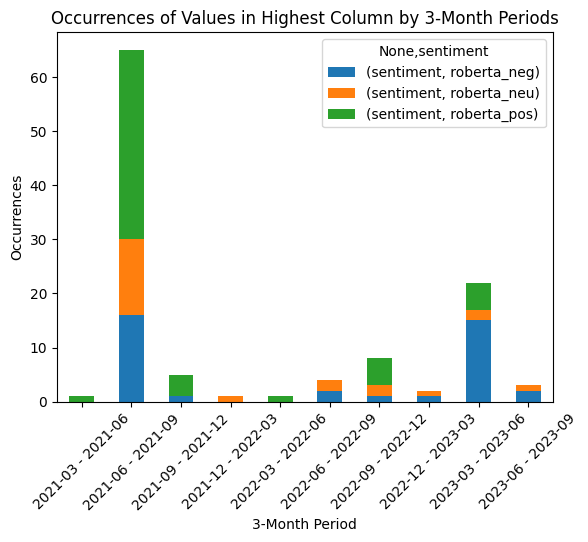

neemacademy.csv starts
Total reviews: 216


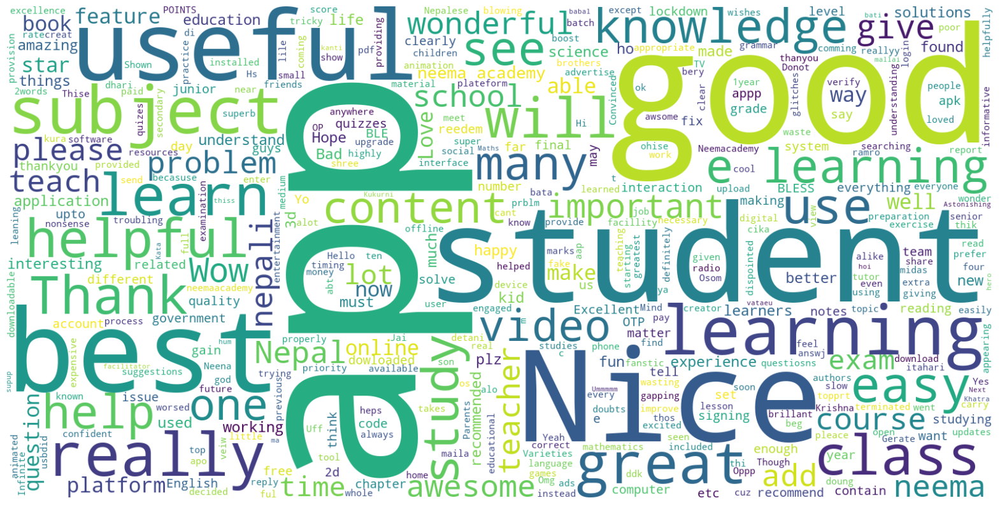

mean score: 4.25462962962963
Review Count
score
1     24
2     11
3      6
4     20
5    155
Name: count, dtype: int64


  0%|          | 0/216 [00:00<?, ?it/s]

Total positive reviews: 156
Total negative reviews: 20
Total neutral reviews: 40
Total notification word: 0
Negative reviews, single word: Counter({'app': 5, 'problem': 3, 'working': 3, '..': 3, 'good': 3, 'bad': 3, 'signing': 2, 'otp': 2, 'number': 2, 'dowloaded': 2, 'content': 2, 'apps': 2, 'application': 1, 'tell': 1, 'enter': 1, 'system': 1, 'send': 1, 'process': 1, 'terminated': 1, 'pleace': 1, 'fix': 1, 'prblm': 1, '👍may': 1, 'issue': 1, 'device': 1, 'even': 1, 'trying': 1, 'open': 1, 'properly': 1, 'reallyy': 1, 'dispointed': 1, 'that😞': 1, 'able': 1, 'view': 1, 'study': 1, 'new': 1, 'update': 1, 'veiw': 1, 'offline': 1, '...': 1, 'online': 1, 'facillity': 1, 'course': 1, 'paid': 1, '7': 1, 'days.its': 1, 'user': 1, 'interface': 1, 'far': 1, 'found': 1, 'troubling': 1, 'feel': 1, 'waste': 1, 'aap': 1, 'instead': 1, 'use': 1, 'time': 1, 'wasting': 1, 'get': 1, 'code': 1, 'verify': 1, 'phone': 1, 'help': 1, 'expensive': 1, 'timing': 1, 'show': 1, 'correct': 1, 'worsed': 1, 'seen':

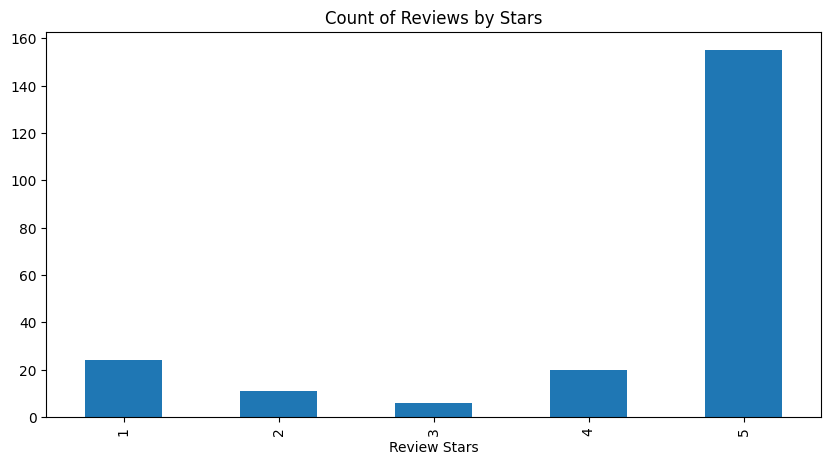

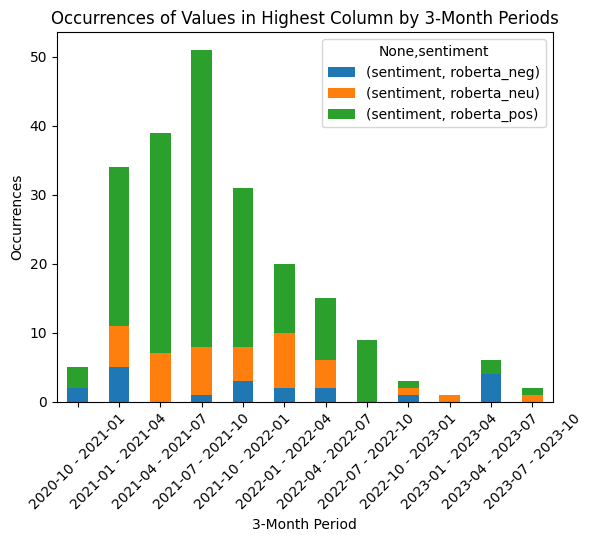

mero.csv starts
Total reviews: 295


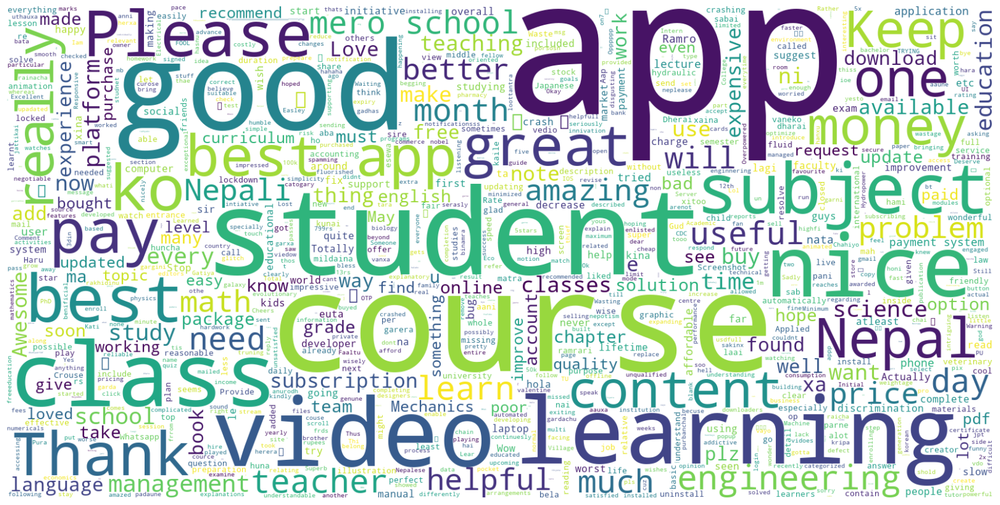

mean score: 3.5322033898305083
Review Count
score
1     78
2     15
3     26
4     24
5    152
Name: count, dtype: int64


  0%|          | 0/295 [00:00<?, ?it/s]

Total positive reviews: 173
Total negative reviews: 66
Total neutral reviews: 56
Total notification word: 2
Negative reviews, single word: Counter({'app': 44, 'course': 27, 'pay': 14, '..': 11, 'class': 10, 'subject': 10, 'video': 9, 'month': 9, 'ko': 9, 'money': 8, 'student': 8, 'day': 7, 'math': 7, 'buy': 6, 'time': 6, 'teacher': 6, 'please': 6, 'subscription': 6, 'one': 6, 'good': 6, '...': 6, 'ni': 6, 'get': 5, '1000': 5, 'problem': 5, '30': 5, 'expensive': 5, 'school': 5, 'option': 4, '10': 4, 'poor': 4, 'price': 4, 'thing': 4, '1': 4, 'know': 4, 'take': 4, 'mero': 4, 'bad': 4, 'language': 4, 'download': 4, 'xa': 4, 'worst': 3, 'bought': 3, 'manual': 3, 'content': 3, 'want': 3, 'u': 3, 'people': 3, 'learning': 3, 'paid': 3, 'every': 3, 'study': 3, 'charge': 3, 'around': 3, 'much': 3, 'le': 3, 'phone': 3, 'tried': 3, 'better': 3, 'something': 3, 'purchase': 3, 'experience': 3, '11': 3, 'useful': 3, 'management': 3, 'xina': 3, 'bug': 3, 'crash': 3, 'closed': 2, 'middle': 2, 'send': 

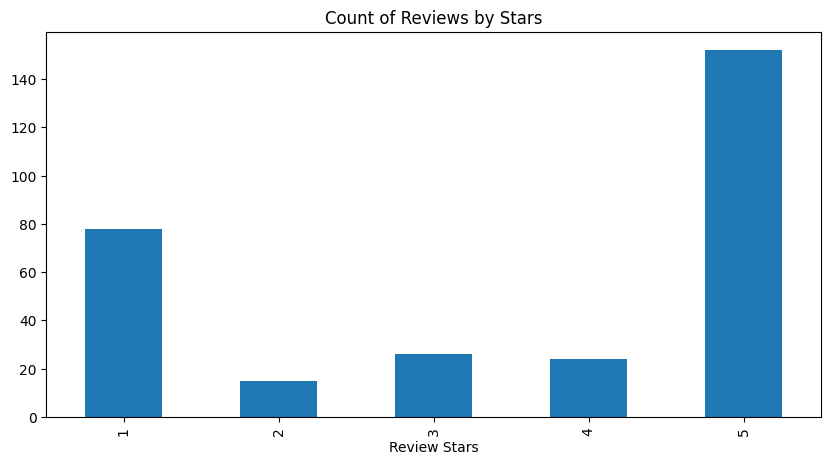

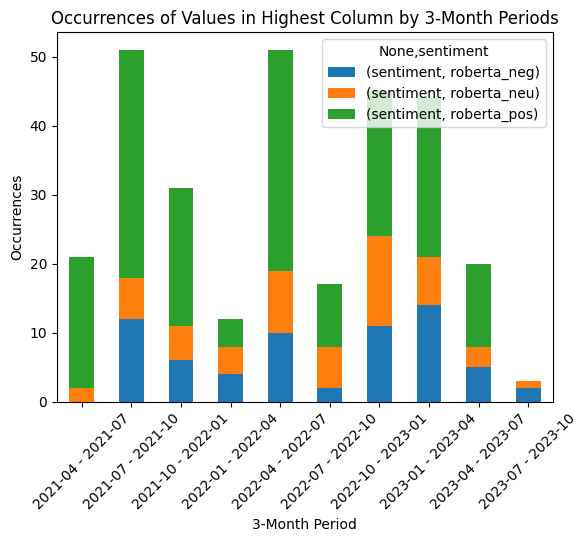

midas.csv starts
Total reviews: 673


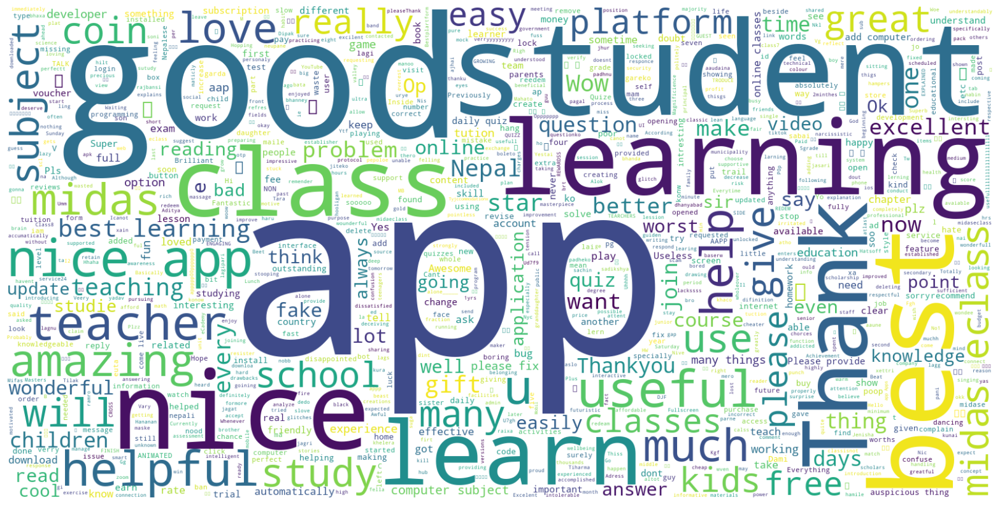

mean score: 4.0059435364041605
Review Count
score
1    122
2     20
3     31
4     59
5    441
Name: count, dtype: int64


  0%|          | 0/673 [00:00<?, ?it/s]

Total positive reviews: 466
Total negative reviews: 93
Total neutral reviews: 114
Total notification word: 0
Negative reviews, single word: Counter({'app': 45, 'class': 16, 'get': 11, 'good': 9, 'please': 9, 'fix': 7, 'worst': 7, 'coin': 7, 'fake': 7, 'like': 7, 'gift': 7, 'ever': 6, 'computer': 6, 'also': 6, '...': 6, 'bad': 6, 'even': 5, 'subject': 5, 'course': 5, 'quiz': 5, 'option': 5, 'say': 5, 'midas': 5, 'use': 4, 'bug': 4, 'want': 4, 'many': 4, 'always': 4, '..': 4, 'school': 4, 'time': 4, 'useless': 4, 'point': 4, 'update': 4, 'much': 3, 'teacher': 3, 'question': 3, 'one': 3, 'add': 3, 'video': 3, 'online': 3, 'account': 3, 'button': 3, 'money': 3, 'need': 3, 'daily': 3, '1': 3, 'give': 3, 'problem': 3, 'waste': 3, 'tution': 3, 'game': 3, 'poop': 3, 'post': 3, 'hate': 3, 'pls': 2, 'user': 2, 'interface': 2, 'worth': 2, 'answer': 2, 'word': 2, 'student': 2, 'related': 2, 'developer': 2, 'programming': 2, 'development': 2, 'etc': 2, 'installed': 2, 'learn': 2, 'service': 2, 'got

             sentiment                        
sentiment  roberta_neg roberta_neu roberta_pos
at                                            
2021-12-31           3           4          16
2022-03-31          23          36         145
2022-06-30          28          33         139
2022-09-30          22          25          82
2022-12-31           5           6          33
2023-03-31           4           8          37
2023-06-30           8           2          14


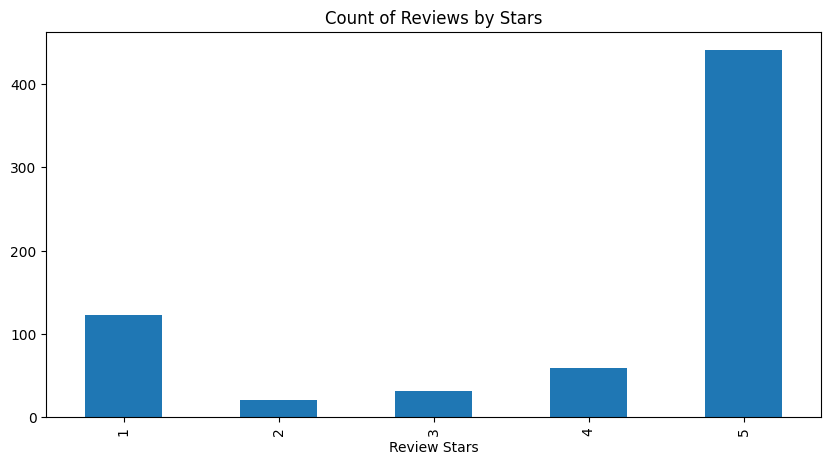

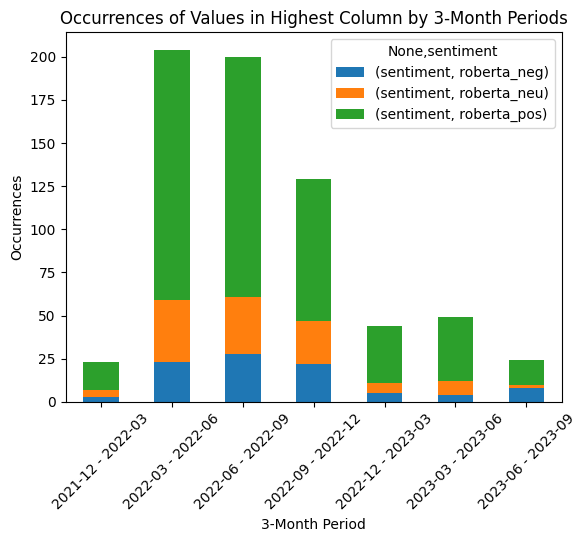

In [19]:
for name in app_ids:
    name = save_name(name)
    print(name, 'starts')
    df = pd.read_csv(name, encoding = "utf")
    print("Total reviews:", len(df.index))
    word_cloud(df)
    mean_score(df)
    review_count(df)
    df = data_after_roberta(df)
    sent_count(df)
    preprocess_reviews(df)
    neg = count_tuple_occurrences(df, 'roberta_neg', 1)
    pos = count_tuple_occurrences(df, 'roberta_pos', 1)
    neu = count_tuple_occurrences(df, 'roberta_neu', 1)
    count_words(df)
    print("Negative reviews, single word:", neg)
    print("-----")
    print("Positive reviews, single word:", pos)
    print("-----")
    print("Neutral reviews, single word:", neu)
    print("------------")
    print("------------")
    print("------------")
    neg = count_tuple_occurrences(df, 'roberta_neg', 2)
    pos = count_tuple_occurrences(df, 'roberta_pos', 2)
    neu = count_tuple_occurrences(df, 'roberta_neu', 2)
    print("Negative reviews, tuple:", neg)
    print("-----")
    print("Positive reviews, tuple:", pos)
    print("-----")
    print("Neutral reviews, tuple:", neu)
    print("------------")
    print("------------")
    print("------------")
    create_bargraph(df)

In [20]:
def comments_after_date(df):
    c = 0
    df = pd.read_csv(name, encoding = "utf")
    for k,p in zip(df["content"], df["at"]):
        
        if '2023' in p:
            c += 1
            print(p, k.lower())
    print(c)

In [21]:
for name in app_ids:
    name = save_name(name)
    print(name, 'starts')
    df = pd.read_csv(name, encoding = "utf")
    comments_after_date(df)

mysecondteacher.csv starts
2023-04-04 19:06:49 does not show notification. also the idea of not being able to watch a video without interference is terrible.
2023-03-02 06:16:51 it is an awesome application for students but there are no computer science topics videos. there should be computer science topic videos also. please add computer science topics video. in computer science you can add only programming also because that is bit difficult for student to understand.
2023-03-09 07:40:25 inefficient and hard to work with and around it, simple things are made more harder than it is supposed to be. atleast make it as good as google classroom.
2023-03-09 07:38:29 this app is buggy and doesn't work half of the time. the colleges and schools that use this are shills and don't care about the student experience.
2023-02-13 16:16:54 in this app there is only 10-12. i think you should add class 9 also it will help students who are in that grade. thank you.
2023-03-22 01:56:24 this is very usel

mysecondteacher.csv starts
Total reviews: 112


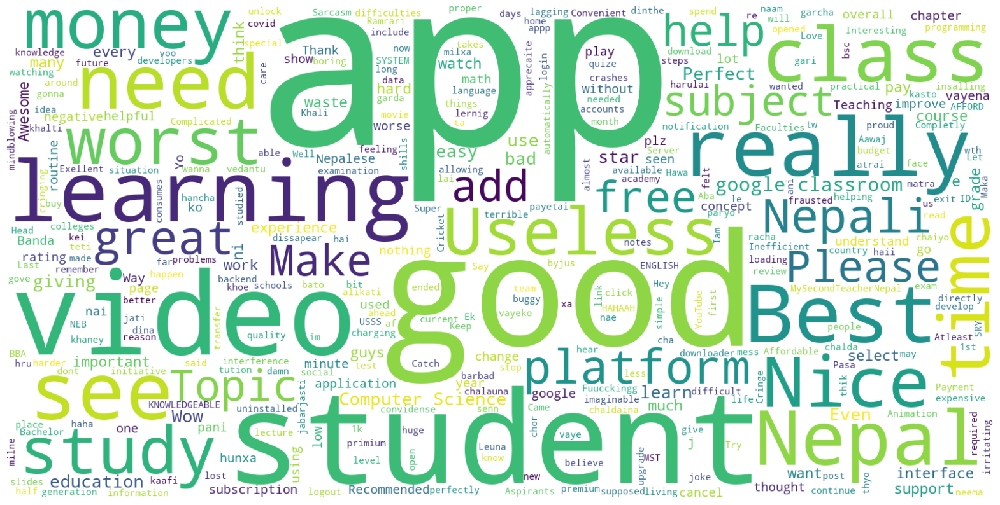

mean score: 2.9464285714285716
neemacademy.csv starts
Total reviews: 216


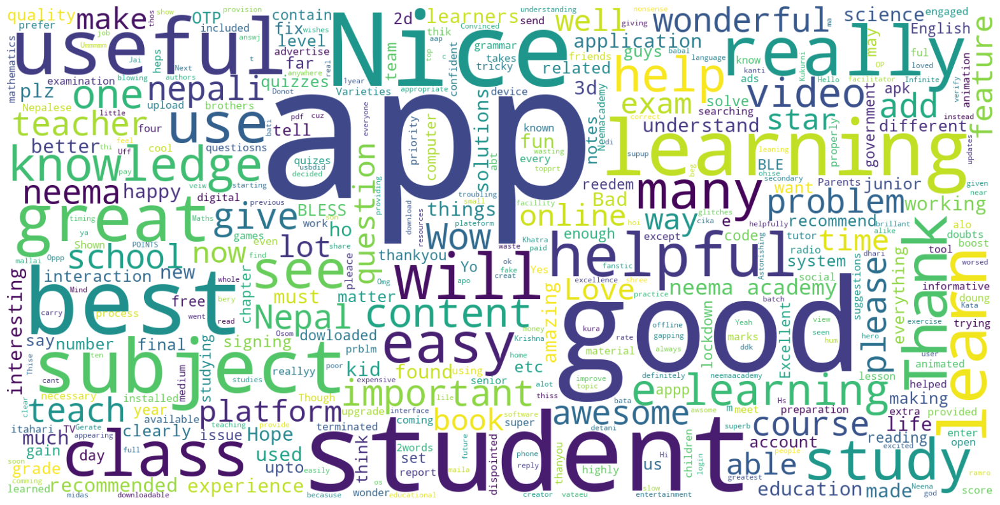

mean score: 4.25462962962963
mero.csv starts
Total reviews: 295


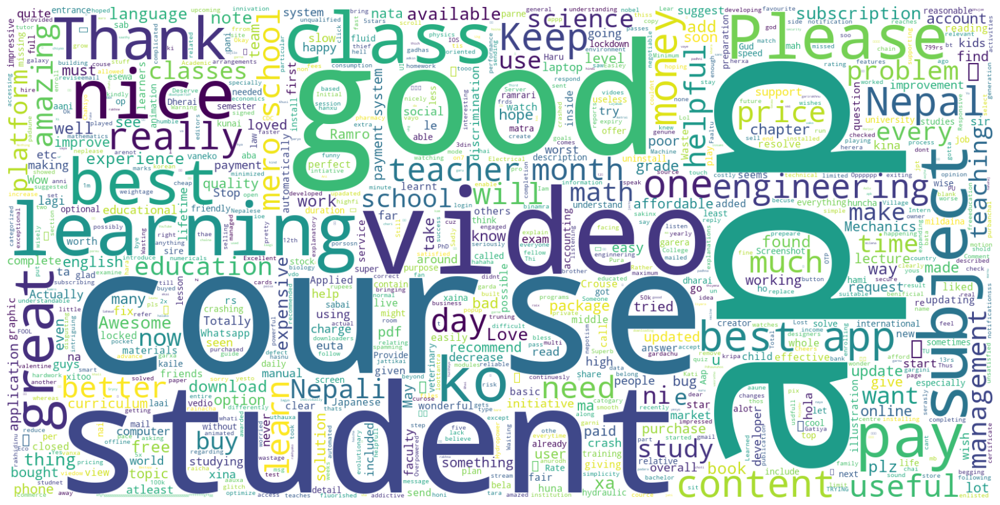

mean score: 3.5322033898305083
midas.csv starts
Total reviews: 673


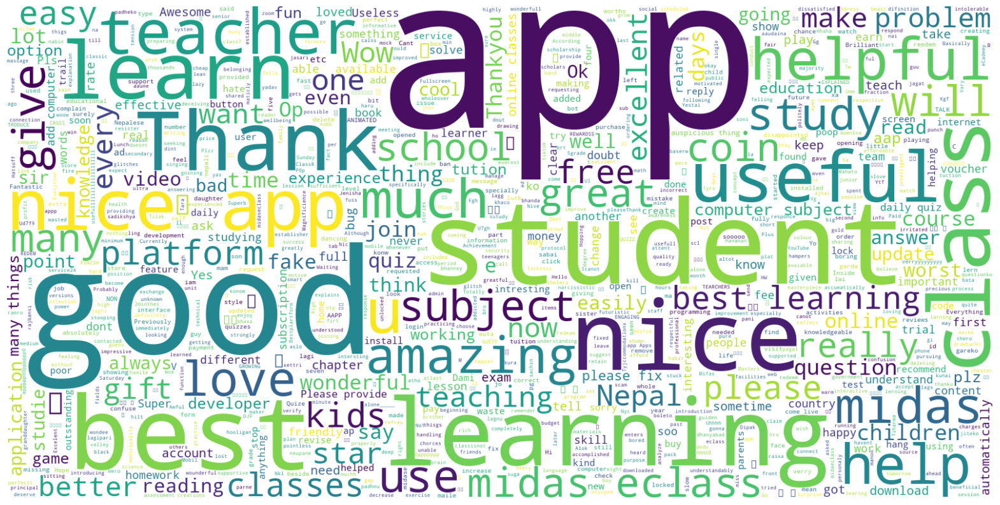

mean score: 4.0059435364041605


In [22]:
for name in app_ids:
    name = save_name(name)
    print(name, 'starts')
    df = pd.read_csv(name, encoding = "utf")
    print("Total reviews:", len(df.index))
    word_cloud(df)
    mean_score(df)

mysecondteacher.csv starts


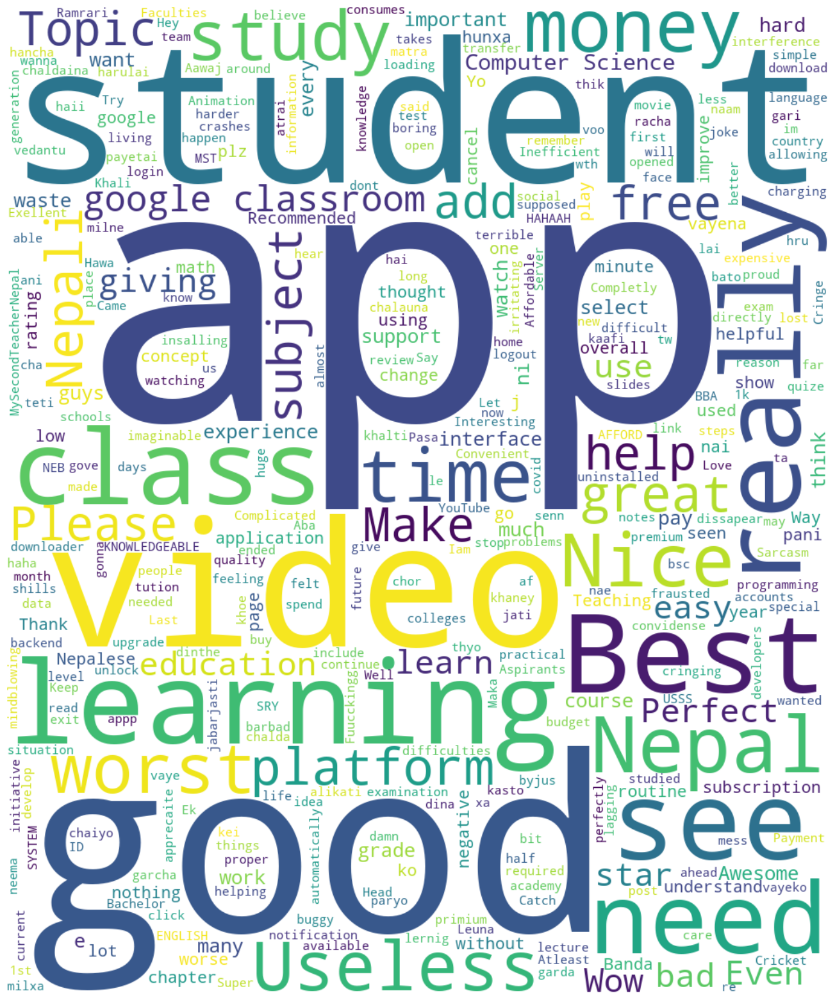

neemacademy.csv starts


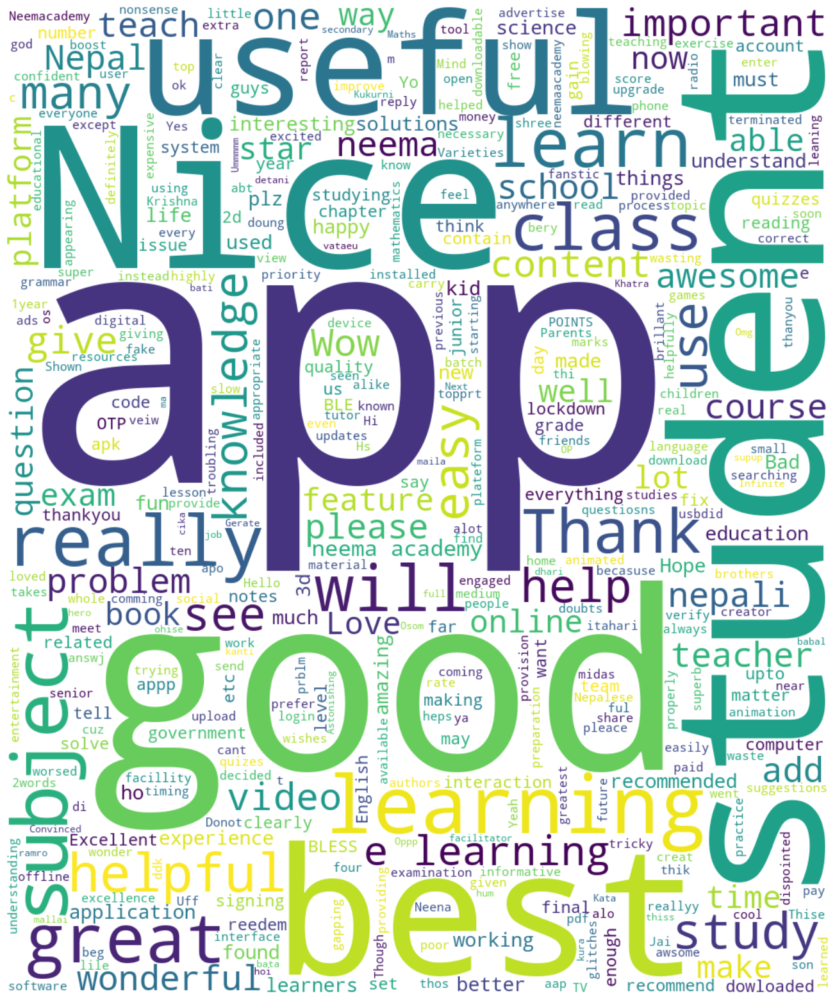

mero.csv starts


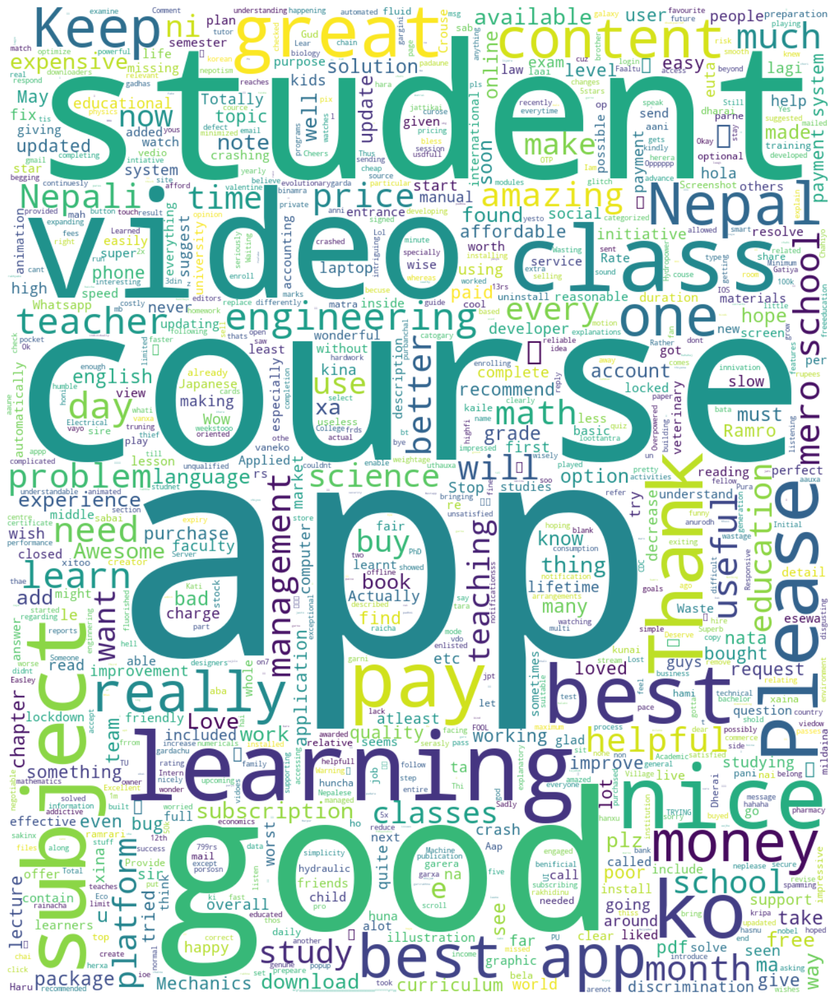

midas.csv starts


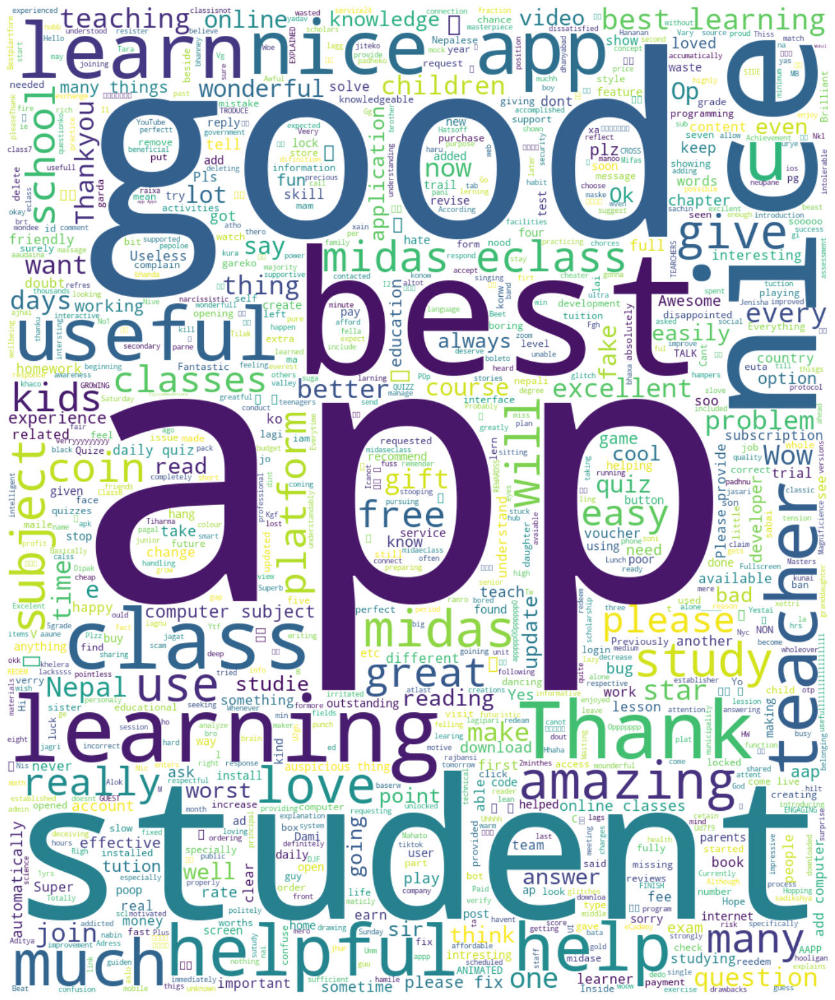

In [23]:
for name in app_ids:
    name = save_name(name)
    print(name, 'starts')
    df = pd.read_csv(name, encoding = "utf")
    word_cloud_comp(df)

In [24]:
for name in app_ids:
    name = save_name(name)
    print(name, 'starts')
    df = pd.read_csv(name, encoding = "utf")
    print("Total reviews:", len(df.index))
    df = data_after_roberta(df)
    sent_count(df)
    preprocess_reviews(df)

mysecondteacher.csv starts
Total reviews: 112


  0%|          | 0/112 [00:00<?, ?it/s]

Total positive reviews: 51
Total negative reviews: 38
Total neutral reviews: 23
neemacademy.csv starts
Total reviews: 216


  0%|          | 0/216 [00:00<?, ?it/s]

Total positive reviews: 156
Total negative reviews: 20
Total neutral reviews: 40
mero.csv starts
Total reviews: 295


  0%|          | 0/295 [00:00<?, ?it/s]

Total positive reviews: 173
Total negative reviews: 66
Total neutral reviews: 56
midas.csv starts
Total reviews: 673


  0%|          | 0/673 [00:00<?, ?it/s]

Total positive reviews: 466
Total negative reviews: 93
Total neutral reviews: 114


In [25]:
for name in app_ids:
    name = save_name(name)
    print(name, 'starts')
    df = pd.read_csv(name, encoding = "utf")
    print("Total reviews:", len(df.index))
    df = data_after_roberta(df)
    sent_count(df)
    preprocess_reviews(df)
    neg = count_tuple_occurrences(df, 'roberta_neg', 1)
    pos = count_tuple_occurrences(df, 'roberta_pos', 1)
    neu = count_tuple_occurrences(df, 'roberta_neu', 1)
    print("Negative reviews, single word:", neg)
    print("-----")
    print("Positive reviews, single word:", pos)
    print("-----")
    print("Neutral reviews, single word:", neu)
    print("------------")
    print("------------")
    print("------------")

mysecondteacher.csv starts
Total reviews: 112


  0%|          | 0/112 [00:00<?, ?it/s]

Total positive reviews: 51
Total negative reviews: 38
Total neutral reviews: 23
Negative reviews, single word: Counter({'app': 28, 'good': 6, 'worst': 6, 'money': 6, 'see': 6, 'google': 5, 'useless': 5, 'time': 4, 'study': 4, 'ever': 4, 'need': 4, 'free': 4, 'star': 4, 'giving': 4, 'video': 3, 'hard': 3, 'work': 3, 'classroom': 3, 'use': 3, 'class': 3, 'really': 3, 'like': 3, 'waste': 3, 'want': 3, 'bad': 3, 'important': 3, 'show': 2, 'watch': 2, 'without': 2, 'make': 2, 'student': 2, 'experience': 2, 'many': 2, 'one': 2, 'used': 2, 'worse': 2, 'every': 2, 'even': 2, 'nothing': 2, '🙄🙄': 2, 'page': 2, 'pay': 2, 'get': 2, 'guy': 2, '10': 2, 'low': 2, 'rating': 2, 'negative': 2, '..': 2, 'plz': 2, 'cancel': 2, 'seen': 2, 'j': 2, '...': 2, 'notification': 1, 'also': 1, 'idea': 1, 'able': 1, 'interference': 1, 'terrible': 1, 'inefficient': 1, 'around': 1, 'simple': 1, 'thing': 1, 'made': 1, 'harder': 1, 'supposed': 1, 'atleast': 1, 'buggy': 1, 'half': 1, 'college': 1, 'school': 1, 'shill': 

  0%|          | 0/216 [00:00<?, ?it/s]

Total positive reviews: 156
Total negative reviews: 20
Total neutral reviews: 40
Negative reviews, single word: Counter({'app': 5, 'problem': 3, 'working': 3, '..': 3, 'good': 3, 'bad': 3, 'signing': 2, 'otp': 2, 'number': 2, 'dowloaded': 2, 'content': 2, 'apps': 2, 'application': 1, 'tell': 1, 'enter': 1, 'system': 1, 'send': 1, 'process': 1, 'terminated': 1, 'pleace': 1, 'fix': 1, 'prblm': 1, '👍may': 1, 'issue': 1, 'device': 1, 'even': 1, 'trying': 1, 'open': 1, 'properly': 1, 'reallyy': 1, 'dispointed': 1, 'that😞': 1, 'able': 1, 'view': 1, 'study': 1, 'new': 1, 'update': 1, 'veiw': 1, 'offline': 1, '...': 1, 'online': 1, 'facillity': 1, 'course': 1, 'paid': 1, '7': 1, 'days.its': 1, 'user': 1, 'interface': 1, 'far': 1, 'found': 1, 'troubling': 1, 'feel': 1, 'waste': 1, 'aap': 1, 'instead': 1, 'use': 1, 'time': 1, 'wasting': 1, 'get': 1, 'code': 1, 'verify': 1, 'phone': 1, 'help': 1, 'expensive': 1, 'timing': 1, 'show': 1, 'correct': 1, 'worsed': 1, 'seen': 1, 'life': 1, 'becasuse': 

  0%|          | 0/295 [00:00<?, ?it/s]

Total positive reviews: 173
Total negative reviews: 66
Total neutral reviews: 56
Negative reviews, single word: Counter({'app': 44, 'course': 27, 'pay': 14, '..': 11, 'class': 10, 'subject': 10, 'video': 9, 'month': 9, 'ko': 9, 'money': 8, 'student': 8, 'day': 7, 'math': 7, 'buy': 6, 'time': 6, 'teacher': 6, 'please': 6, 'subscription': 6, 'one': 6, 'good': 6, '...': 6, 'ni': 6, 'get': 5, '1000': 5, 'problem': 5, '30': 5, 'expensive': 5, 'school': 5, 'option': 4, '10': 4, 'poor': 4, 'price': 4, 'thing': 4, '1': 4, 'know': 4, 'take': 4, 'mero': 4, 'bad': 4, 'language': 4, 'download': 4, 'xa': 4, 'worst': 3, 'bought': 3, 'manual': 3, 'content': 3, 'want': 3, 'u': 3, 'people': 3, 'learning': 3, 'paid': 3, 'every': 3, 'study': 3, 'charge': 3, 'around': 3, 'much': 3, 'le': 3, 'phone': 3, 'tried': 3, 'better': 3, 'something': 3, 'purchase': 3, 'experience': 3, '11': 3, 'useful': 3, 'management': 3, 'xina': 3, 'bug': 3, 'crash': 3, 'closed': 2, 'middle': 2, 'send': 2, 'notification': 2, 'nepa

  0%|          | 0/673 [00:00<?, ?it/s]

Total positive reviews: 466
Total negative reviews: 93
Total neutral reviews: 114
Negative reviews, single word: Counter({'app': 45, 'class': 16, 'get': 11, 'good': 9, 'please': 9, 'fix': 7, 'worst': 7, 'coin': 7, 'fake': 7, 'like': 7, 'gift': 7, 'ever': 6, 'computer': 6, 'also': 6, '...': 6, 'bad': 6, 'even': 5, 'subject': 5, 'course': 5, 'quiz': 5, 'option': 5, 'say': 5, 'midas': 5, 'use': 4, 'bug': 4, 'want': 4, 'many': 4, 'always': 4, '..': 4, 'school': 4, 'time': 4, 'useless': 4, 'point': 4, 'update': 4, 'much': 3, 'teacher': 3, 'question': 3, 'one': 3, 'add': 3, 'video': 3, 'online': 3, 'account': 3, 'button': 3, 'money': 3, 'need': 3, 'daily': 3, '1': 3, 'give': 3, 'problem': 3, 'waste': 3, 'tution': 3, 'game': 3, 'poop': 3, 'post': 3, 'hate': 3, 'pls': 2, 'user': 2, 'interface': 2, 'worth': 2, 'answer': 2, 'word': 2, 'student': 2, 'related': 2, 'developer': 2, 'programming': 2, 'development': 2, 'etc': 2, 'installed': 2, 'learn': 2, 'service': 2, 'got': 2, 'soon': 2, 'non': 2, 

mysecondteacher.csv starts
Total reviews: 112


  0%|          | 0/112 [00:00<?, ?it/s]

Total positive reviews: 51
Total negative reviews: 38
Total neutral reviews: 23
Negative reviews, tuple: Counter({'worst app': 6, 'app ever': 4, 'google classroom': 3, 'useless app': 2, 'app good': 2, 'waste time': 2, 'app giving': 2, 'plz cancel': 2, 'cancel see': 2, 'ever seen': 2, 'show notification': 1, 'notification also': 1, 'also idea': 1, 'idea able': 1, 'able watch': 1, 'watch video': 1, 'video without': 1, 'without interference': 1, 'interference terrible': 1, 'inefficient hard': 1, 'hard work': 1, 'work around': 1, 'around simple': 1, 'simple thing': 1, 'thing made': 1, 'made harder': 1, 'harder supposed': 1, 'supposed atleast': 1, 'atleast make': 1, 'make good': 1, 'good google': 1, 'app buggy': 1, 'buggy work': 1, 'work half': 1, 'half time': 1, 'time college': 1, 'college school': 1, 'school use': 1, 'use shill': 1, 'shill care': 1, 'care student': 1, 'student experience': 1, 'app work': 1, 'work proper': 1, 'proper face': 1, 'face many': 1, 'many difficulty': 1, 'difficu

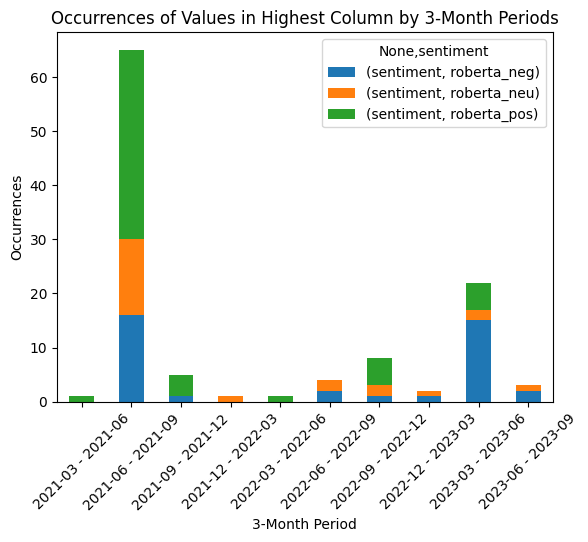

neemacademy.csv starts
Total reviews: 216


  0%|          | 0/216 [00:00<?, ?it/s]

Total positive reviews: 156
Total negative reviews: 20
Total neutral reviews: 40
Negative reviews, tuple: Counter({'dowloaded content': 2, 'problem signing': 1, 'signing application': 1, 'application tell': 1, 'tell enter': 1, 'enter otp': 1, 'otp system': 1, 'system send': 1, 'send otp': 1, 'otp number': 1, 'number signing': 1, 'signing process': 1, 'process terminated': 1, 'terminated pleace': 1, 'pleace fix': 1, 'fix prblm': 1, 'app working': 1, 'working 👍may': 1, '👍may issue': 1, 'issue device': 1, 'device even': 1, 'even trying': 1, 'trying open': 1, 'open working': 1, 'working properly': 1, 'properly reallyy': 1, 'reallyy dispointed': 1, 'dispointed that😞': 1, 'able view': 1, 'view study': 1, 'study dowloaded': 1, 'content new': 1, 'new update': 1, 'update ..': 1, '.. veiw': 1, 'veiw dowloaded': 1, 'content offline': 1, 'offline ...': 1, '... online': 1, 'online facillity': 1, 'facillity ..': 1, 'course paid': 1, 'paid 7': 1, '7 days.its': 1, 'days.its user': 1, 'user interface':

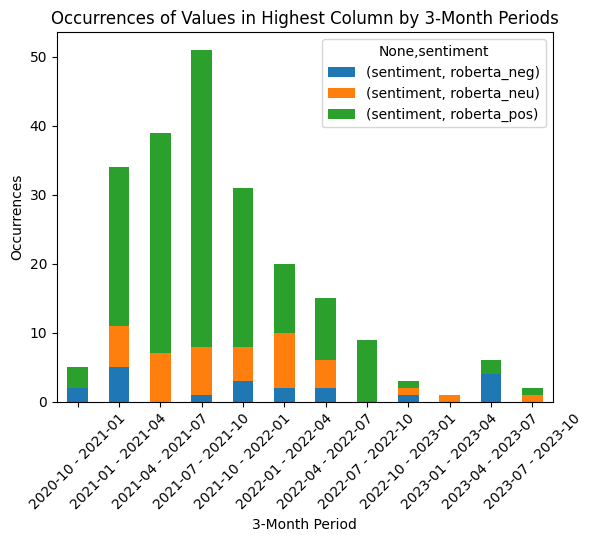

mero.csv starts
Total reviews: 295


  0%|          | 0/295 [00:00<?, ?it/s]

Total positive reviews: 173
Total negative reviews: 66
Total neutral reviews: 56
Negative reviews, tuple: Counter({'buy course': 4, 'class 10': 4, '30 day': 4, '1 month': 4, 'mero school': 4, 'worst app': 3, 'pay 1000': 3, 'purchase course': 3, 'u pay': 2, 'pay money': 2, 'waste money': 2, 'applied mechanic': 2, 'course 1': 2, 'know pay': 2, 'take money': 2, 'using app': 2, 'app bad': 2, 'subject course': 2, 'app crashing': 2, 'app good': 2, 'know even': 2, 'download garera': 2, 'math ko': 2, 'ko course': 2, 'app glitch.please': 1, 'glitch.please optimize': 1, 'optimize it.i': 1, 'it.i recently': 1, 'recently purchased': 1, 'purchased couse': 1, 'couse watching': 1, 'watching video': 1, 'video get': 1, 'get closed': 1, 'closed automatically': 1, 'automatically middle': 1, 'option buy': 1, 'course respond': 1, 'respond message': 1, 'message whatsapp': 1, 'app ever': 1, 'ever selling': 1, 'selling course': 1, 'course begging': 1, 'begging money': 1, 'money work': 1, 'work send': 1, 'send

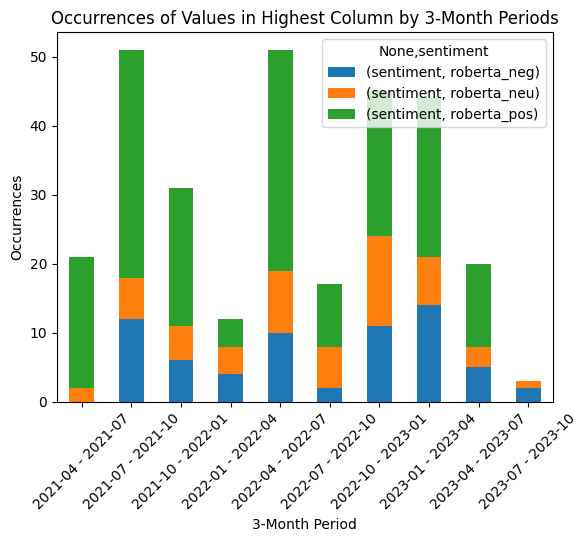

midas.csv starts
Total reviews: 673


  0%|          | 0/673 [00:00<?, ?it/s]

Total positive reviews: 466
Total negative reviews: 93
Total neutral reviews: 114
Negative reviews, tuple: Counter({'app ever': 4, 'worst app': 4, 'computer subject': 4, 'like app': 4, 'please fix': 4, 'online class': 3, 'class also': 3, 'daily quiz': 3, 'say update': 3, 'word even': 2, 'app developer': 2, 'development course': 2, 'account app': 2, 'many bug': 2, 'nice app': 2, 'fake app': 2, 'fix problem': 2, 'bad app': 2, 'always say': 2, 'update please': 2, 'come live': 2, 'nood game': 2, 'game poop': 2, 'get gift': 2, 'gift store': 2, 'midas eclass': 2, 'hate app': 2, 'okay beginning': 1, 'beginning later': 1, 'later started': 1, 'started use': 1, 'use often': 1, 'often lack': 1, 'lack sooooo': 1, 'sooooo much': 1, 'much pls': 1, 'pls fix': 1, 'fix bug': 1, 'bug 🐛': 1, 'tab user': 1, 'user interface': 1, 'interface good': 1, 'worth app': 1, 'ever teacher': 1, 'teacher want': 1, 'want answer': 1, 'answer question': 1, 'question worth': 1, 'app word': 1, 'even reflect': 1, 'reflect w

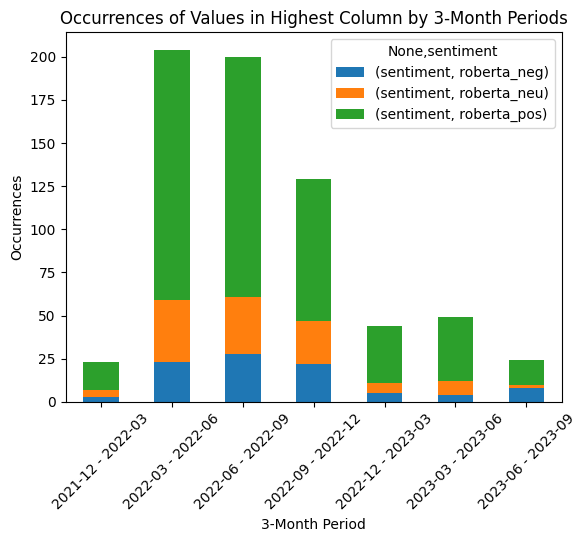

In [26]:
for name in app_ids:
    name = save_name(name)
    print(name, 'starts')
    df = pd.read_csv(name, encoding = "utf")
    print("Total reviews:", len(df.index))
    df = data_after_roberta(df)
    sent_count(df)
    preprocess_reviews(df)
    neg = count_tuple_occurrences(df, 'roberta_neg', 2)
    pos = count_tuple_occurrences(df, 'roberta_pos', 2)
    neu = count_tuple_occurrences(df, 'roberta_neu', 2)
    print("Negative reviews, tuple:", neg)
    print("-----")
    print("Positive reviews, tuple:", pos)
    print("-----")
    print("Neutral reviews, tuple:", neu)
    print("------------")
    print("------------")
    print("------------")
    create_bargraph(df)